In [1]:
# import libraries
import pandas as pd
import numpy as np
import seaborn as sns
import pickle
import plotly.express as px

In [2]:
df_pp = pd.read_csv('US_Dataset_PowerPlants_Locations_Nature_County.csv')

In [3]:
df_pp.head()

,country,country_long,name,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,commissioning_year,owner,source,url,geolocation_source,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017
0,USA,United States of America,12 Applegate Solar LLC,USA0059371,1.9,40.2003,-74.5761,Solar,2012.0,SunRay Power LLC,U.S. Energy Information Administration,http://www.eia.gov/electricity/data/browser/,U.S. Energy Information Administration,2.41461,2.350,2.430,2.492,2.276
1,USA,United States of America,126 Grove Solar LLC,USA0060858,2.0,42.0761,-71.4227,Solar,2012.0,126 Grove Solar LLC,U.S. Energy Information Administration,http://www.eia.gov/electricity/data/browser/,U.S. Energy Information Administration,NaN,NaN,NaN,2.416,2.251
2,USA,United States of America,1420 Coil Av #C,USA0057310,1.3,33.7943,-118.2414,Solar,2011.0,Konoike Pacific,U.S. Energy Information Administration,http://www.eia.gov/electricity/data/browser/,U.S. Energy Information Administration,1.52800,2.149,1.515,1.592,1.660
3,USA,United States of America,145 Talmadge Solar,USA0057458,3.8,40.5358,-74.3913,Solar,2011.0,Avidan Energy Solutions,U.S. Energy Information Administration,http://www.eia.gov/electricity/data/browser/,U.S. Energy Information Administration,5.03600,4.524,4.802,5.051,4.819
4,USA,United States of America,1515 S Caron Road,USA0007770,4.2,41.9084,-89.0466,Gas,2000.0,Rochelle Municipal Utilities,U.S. Energy Information Administration,http://www.eia.gov/electricity/data/browser/,U.S. Energy Information Administration,0.21500,0.178,0.271,0.306,0.264


In [4]:
df_pp.dtypes

country                 object
country_long            object
name                    object
gppd_idnr               object
capacity_mw            float64
latitude               float64
longitude              float64
primary_fuel            object
commissioning_year     float64
owner                   object
source                  object
url                     object
geolocation_source      object
generation_gwh_2013    float64
generation_gwh_2014    float64
generation_gwh_2015    float64
generation_gwh_2016    float64
generation_gwh_2017    float64
dtype: object

## Column cleaning

In [5]:
df_pp['country'].unique()

array(['USA'], dtype=object)

In [6]:
df_pp['country_long'].unique()

array(['United States of America'], dtype=object)

In [7]:
df_pp['name'].describe()

count           8686
unique          8674
top       Beaver Dam
freq               2
Name: name, dtype: object

In [8]:
df_pp[df_pp['name'] == "Beaver Dam"] # two plants of different fuel types

,country,country_long,name,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,commissioning_year,owner,source,url,geolocation_source,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017
598,USA,United States of America,Beaver Dam,USA0058811,22.0,41.6114,-76.8431,Gas,2016.0,Beaver Dam Energy LLC,U.S. Energy Information Administration,http://www.eia.gov/electricity/data/browser/,U.S. Energy Information Administration,NaN,NaN,NaN,62.346,63.291
599,USA,United States of America,Beaver Dam,USA0000182,112.0,36.4215,-93.8474,Hydro,1965.0,USCE-Little Rock District,U.S. Energy Information Administration,http://www.eia.gov/electricity/data/browser/,U.S. Energy Information Administration,77.201,126.245,185.319,164.928,136.794


How should we deal with multiple plants in a single FIPS location??

In [9]:
df_pp['gppd_idnr'].describe() # all ids are unique!

count           8686
unique          8686
top       USA0054518
freq               1
Name: gppd_idnr, dtype: object

In [10]:
df_pp['capacity_mw'].describe() # all numbers positive

count    8686.000000
mean      137.418426
std       368.964708
min         1.000000
25%         3.000000
50%        10.500000
75%        79.800000
max      6809.000000
Name: capacity_mw, dtype: float64

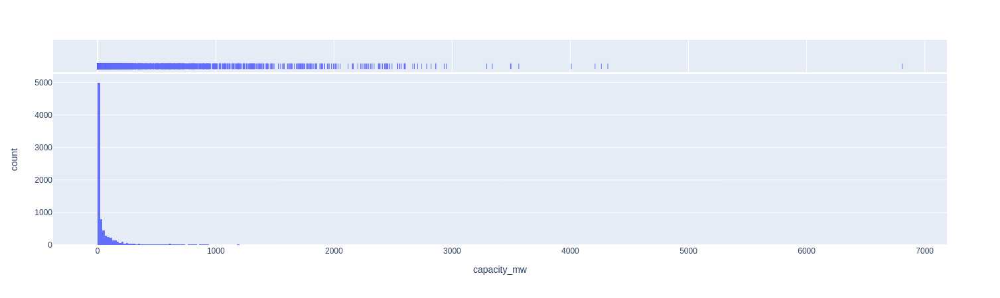

In [11]:
fig = px.histogram(df_pp, x="capacity_mw", marginal="rug", hover_data=df_pp.columns)
fig.show()

In [12]:
df_pp['latitude'].describe()

count    8686.000000
mean       38.966632
std         5.762123
min        13.303500
25%        35.150700
50%        39.453450
75%        42.493225
max        71.292000
Name: latitude, dtype: float64

In [13]:
df_pp['longitude'].describe()

count    8686.000000
mean      -94.737049
std        20.054451
min      -171.712400
25%      -112.047200
50%       -91.524250
75%       -78.844025
max       144.899900
Name: longitude, dtype: float64

In [14]:
df_pp['primary_fuel'].value_counts()

Solar           2290
Gas             1741
Hydro           1457
Wind            1043
Oil              847
Waste            567
Coal             338
Biomass          156
Geothermal        65
Nuclear           61
Storage           58
Cogeneration      34
Other             17
Petcoke           12
Name: primary_fuel, dtype: int64

In [15]:
df_pp['commissioning_year'].describe()

count    8665.000000
mean     1994.745500
std        24.912354
min      1896.000000
25%      1985.000000
50%      2004.000000
75%      2013.000000
max      2018.000000
Name: commissioning_year, dtype: float64

In [16]:
# There are plants put in here that did not start production until AFTER the 2012-2016 period. We'll drop those.
for i,x in df_pp.iterrows():
    try:
        x_temp = int(x['commissioning_year'])
    except:
        print(x)
# we'll also drop the observations that don't have a commissioning year

country                                                              USA
country_long                                    United States of America
name                                                        A.E.S. Corp.
gppd_idnr                                                     WRI1026808
capacity_mw                                                        454.3
latitude                                                         17.9474
longitude                                                       -66.1494
primary_fuel                                                        Coal
commissioning_year                                                   NaN
owner                                                    AES Corporation
source                                                      Fluor; PREPA
url                    http://www.fluor.com/projects/solid-fueled-pow...
geolocation_source                                                   WRI
generation_gwh_2013                                

In [17]:
df_pp = df_pp[~pd.isna(df_pp['commissioning_year'])]


In [18]:
df_pp.loc[:,'commissioning_year'] = df_pp['commissioning_year'].astype('int')

In [19]:
df_pp = df_pp[df_pp['commissioning_year'] <= 2014]

In [20]:
df_pp[pd.isna(df_pp['generation_gwh_2015'])]

,country,country_long,name,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,commissioning_year,owner,source,url,geolocation_source,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017
1,USA,United States of America,126 Grove Solar LLC,USA0060858,2.0,42.0761,-71.4227,Solar,2012,126 Grove Solar LLC,U.S. Energy Information Administration,http://www.eia.gov/electricity/data/browser/,U.S. Energy Information Administration,NaN,NaN,NaN,2.416,2.251
5,USA,United States of America,158th Fighter Wing Solar Farm,USA0060542,1.3,44.4777,-73.1534,Solar,2011,158th Fighter Wing,U.S. Energy Information Administration,http://www.eia.gov/electricity/data/browser/,U.S. Energy Information Administration,NaN,NaN,NaN,1.655,1.616
18,USA,United States of America,350 Clark Solar NG LLC,USA0061224,1.8,40.8942,-74.7302,Solar,2011,350 Clark Solar NG LLC,U.S. Energy Information Administration,http://www.eia.gov/electricity/data/browser/,U.S. Energy Information Administration,NaN,NaN,NaN,2.167,1.143
20,USA,United States of America,433 Purchase Solar NG LLC,USA0061237,2.5,41.8094,-71.1922,Solar,2012,433 Purchase Solar NG LLC,U.S. Energy Information Administration,http://www.eia.gov/electricity/data/browser/,U.S. Energy Information Administration,NaN,NaN,NaN,4.219,3.662
42,USA,United States of America,ACCC Mays Landing,USA0060802,1.4,39.4606,-74.6809,Solar,2013,Marina Energy LLC,U.S. Energy Information Administration,http://www.eia.gov/electricity/data/browser/,U.S. Energy Information Administration,NaN,NaN,NaN,2.024,1.985
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8568,USA,United States of America,Wiscoy 170,USA0002646,1.0,42.5042,-78.0828,Hydro,1922,Rochester Gas & Electric Corp,U.S. Energy Information Administration,http://www.eia.gov/electricity/data/browser/,U.S. Energy Information Administration,NaN,NaN,NaN,0.000,NaN
8586,USA,United States of America,Woodhull Hospital,USA0061567,8.0,40.7048,-73.9419,Oil,1990,Woodhull Hospital,U.S. Energy Information Administration,http://www.eia.gov/electricity/data/browser/,U.S. Energy Information Administration,NaN,NaN,NaN,NaN,0.084
8587,USA,United States of America,Woodland,USA0007266,199.0,37.6526,-121.0204,Gas,2002,Modesto Irrigation District,U.S. Energy Information Administration,http://www.eia.gov/electricity/data/browser/,U.S. Energy Information Administration,494.776,897.778,NaN,490.390,429.342
8654,USA,United States of America,Yerba Buena,USA0059257,4.0,37.3058,-121.7550,Storage,2013,Pacific Gas & Electric Co.,U.S. Energy Information Administration,http://www.eia.gov/electricity/data/browser/,U.S. Energy Information Administration,NaN,NaN,NaN,-2.611,-3.357


many plants are not reporting data throughout the 2013-2017 time period. Therefore I will make a variable for average energy production

In [21]:
df_pp['generation_gwh_2013'].describe()

count     6321.000000
mean       570.535106
std       2067.728166
min       -947.600000
25%          1.695000
50%         20.739000
75%        182.628000
max      31431.080000
Name: generation_gwh_2013, dtype: float64

In [22]:
df_pp[df_pp['generation_gwh_2013'] < 0]

,country,country_long,name,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,commissioning_year,owner,source,url,geolocation_source,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017
127,USA,United States of America,Airport Industrial,USA0007995,10.0,38.2844,-104.5308,Oil,2002,Black Hills/Colorado Elec.Util,U.S. Energy Information Administration,http://www.eia.gov/electricity/data/browser/,U.S. Energy Information Administration,-0.165,-0.162,-0.203,-0.209,-0.149
145,USA,United States of America,Albemarle Prime Power Park,USA0056263,3.6,35.4072,-80.1518,Oil,2006,North Carolina Mun Power Agny #1,U.S. Energy Information Administration,http://www.eia.gov/electricity/data/browser/,U.S. Energy Information Administration,-0.012,0.091,0.103,0.090,0.136
279,USA,United States of America,Anderson Erickson,USA0056138,2.0,41.6014,-93.5765,Oil,2000,MidAmerican Energy Co,U.S. Energy Information Administration,http://www.eia.gov/electricity/data/browser/,U.S. Energy Information Administration,-0.045,-0.040,0.010,0.008,0.012
426,USA,United States of America,Augusta Electric Plant No 1,USA0001261,11.5,37.6785,-96.9719,Gas,1965,City of Augusta - (KS),U.S. Energy Information Administration,http://www.eia.gov/electricity/data/browser/,U.S. Energy Information Administration,-0.290,-0.258,-0.218,-0.239,-0.213
427,USA,United States of America,Augusta Electric Plant No 2,USA0006791,20.7,37.6861,-96.9650,Gas,1983,City of Augusta - (KS),U.S. Energy Information Administration,http://www.eia.gov/electricity/data/browser/,U.S. Energy Information Administration,-0.869,-0.569,-0.620,-0.276,-0.795
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8236,USA,United States of America,Waterloo Lundquist,USA0007851,18.0,42.5062,-92.3456,Oil,2000,MidAmerican Energy Co,U.S. Energy Information Administration,http://www.eia.gov/electricity/data/browser/,U.S. Energy Information Administration,-0.414,-0.017,0.108,0.233,0.106
8514,USA,United States of America,Wilmot,USA0001746,13.5,43.4566,-83.1889,Oil,1969,DTE Electric Company,U.S. Energy Information Administration,http://www.eia.gov/electricity/data/browser/,U.S. Energy Information Administration,-0.104,0.046,-0.169,0.084,-0.019
8558,USA,United States of America,Winter,USA0008013,5.6,45.8367,-90.9735,Oil,2002,North Central Power Co Inc,U.S. Energy Information Administration,http://www.eia.gov/electricity/data/browser/,U.S. Energy Information Administration,-0.063,-0.063,-0.081,-0.073,-0.082
8641,USA,United States of America,Yankton,USA0008034,13.4,42.8933,-97.3533,Gas,1972,NorthWestern Energy - (SD),U.S. Energy Information Administration,http://www.eia.gov/electricity/data/browser/,U.S. Energy Information Administration,-0.451,-0.381,-0.520,-0.305,-0.260


sometimes plants will produce negative power because they are for emergency power generation or for meeting peak demand in the power grid. Yards Creek for example is a hydro power plant with two reservoirs. Pumping the water up during low cost overnight hours and generating power during the higher power daytime hours.

In [23]:
df_pp.shape

(6943, 18)

In [24]:
df_pp['generation_gwh_avg'] = np.nanmean(df_pp.filter(regex='generation_gwh_2'),axis = 1)

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning:

Mean of empty slice



In [25]:
df_pp['generation_gwh_avg'].describe()

count     6875.000000
mean       530.438370
std       1931.362891
min       -901.042200
25%          3.280205
50%         23.127400
75%        175.475250
max      32199.041400
Name: generation_gwh_avg, dtype: float64

In [26]:
fig = px.histogram(df_pp, x="generation_gwh_avg", marginal="rug", hover_data=df_pp.columns)
fig.show()

In [27]:
df_pp[pd.isna(df_pp['generation_gwh_avg'])].head()

,country,country_long,name,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,commissioning_year,owner,source,url,geolocation_source,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,generation_gwh_avg
116,USA,United States of America,Agrium Kenai Nitrogen Operations,USA0054452,12.5,60.6732,-151.3784,Gas,1977,Agrium US Inc,U.S. Energy Information Administration,http://www.eia.gov/electricity/data/browser/,U.S. Energy Information Administration,NaN,NaN,NaN,NaN,NaN,NaN
122,USA,United States of America,Aguirre,WRI1026809,1492.0,17.9519,-66.2308,Oil,1975,PREPA,PREPA,http://www.prepa.com/aguirre.asp,WRI,NaN,NaN,NaN,NaN,NaN,NaN
129,USA,United States of America,Akron Recycle Energy Plant,USA0054265,4.0,41.0733,-81.5306,Gas,1979,Akron Energy Systems LLC,U.S. Energy Information Administration,http://www.eia.gov/electricity/data/browser/,U.S. Energy Information Administration,NaN,NaN,NaN,NaN,NaN,NaN
159,USA,United States of America,Algodones,USA0002475,45.0,35.3844,-106.4642,Gas,1955,Public Service Co of NM,U.S. Energy Information Administration,http://www.eia.gov/electricity/data/browser/,U.S. Energy Information Administration,NaN,NaN,NaN,NaN,NaN,NaN
228,USA,United States of America,Amana Society Service Company,USA0061850,21.6,41.7932,-91.8918,Oil,2001,Amana Society Service Co,U.S. Energy Information Administration,http://www.eia.gov/electricity/data/browser/,U.S. Energy Information Administration,NaN,NaN,NaN,NaN,NaN,NaN


some always missing values. We might want to drop these later on

In [28]:
def get_fips(x):

    import requests
    import urllib

    #Encode parameters 
    params = urllib.parse.urlencode({'latitude': x['latitude'], 'longitude':x['longitude'], 'format':'json'})
    #Contruct request URL
    url = 'https://geo.fcc.gov/api/census/block/find?' + params

    #Get response from API
    response = requests.get(url)

    #Parse json in response
    data = response.json()
    return data['County']['FIPS']

In [29]:
df_pp['fips'] = df_pp[['latitude','longitude']].apply(get_fips, axis = 1)

In [30]:
pickle.dump(df_pp,open('df_powerplant_processed.pkl','wb'))

In [31]:
df_pp.head()

,country,country_long,name,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,commissioning_year,owner,source,url,geolocation_source,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,generation_gwh_avg,fips
0,USA,United States of America,12 Applegate Solar LLC,USA0059371,1.9,40.2003,-74.5761,Solar,2012,SunRay Power LLC,U.S. Energy Information Administration,http://www.eia.gov/electricity/data/browser/,U.S. Energy Information Administration,2.41461,2.350,2.430,2.492,2.276,2.392522,34021
1,USA,United States of America,126 Grove Solar LLC,USA0060858,2.0,42.0761,-71.4227,Solar,2012,126 Grove Solar LLC,U.S. Energy Information Administration,http://www.eia.gov/electricity/data/browser/,U.S. Energy Information Administration,NaN,NaN,NaN,2.416,2.251,2.333500,25021
2,USA,United States of America,1420 Coil Av #C,USA0057310,1.3,33.7943,-118.2414,Solar,2011,Konoike Pacific,U.S. Energy Information Administration,http://www.eia.gov/electricity/data/browser/,U.S. Energy Information Administration,1.52800,2.149,1.515,1.592,1.660,1.688800,06037
3,USA,United States of America,145 Talmadge Solar,USA0057458,3.8,40.5358,-74.3913,Solar,2011,Avidan Energy Solutions,U.S. Energy Information Administration,http://www.eia.gov/electricity/data/browser/,U.S. Energy Information Administration,5.03600,4.524,4.802,5.051,4.819,4.846400,34023
4,USA,United States of America,1515 S Caron Road,USA0007770,4.2,41.9084,-89.0466,Gas,2000,Rochelle Municipal Utilities,U.S. Energy Information Administration,http://www.eia.gov/electricity/data/browser/,U.S. Energy Information Administration,0.21500,0.178,0.271,0.306,0.264,0.246800,17141


In [32]:
df_pp_summary = df_pp.groupby('fips')[['capacity_mw','commissioning_year','generation_gwh_avg']].mean().reset_index().rename(columns = {'capacity_mw' : 'avg_capacity_mw', 'commissioning_year' : 'avg_commissioning_year', 'generation_gwh_avg' : 'avg_generation_gwh_13_17'})

In [33]:
df_pp_summary['sum_capacity_mw'] = df_pp.groupby('fips')['capacity_mw'].sum().reset_index().rename(columns = {'capacity_mw' : 'sum_capacity_mw'})['sum_capacity_mw']

In [34]:
df_pp['one'] = 1
df_pp_summary['num_pp'] = df_pp.groupby('fips')['one'].sum().reset_index().rename(columns = {'one' : 'num_pp'})['num_pp']

In [35]:
df_hotencode = df_pp.groupby(['fips','primary_fuel'])['one'].sum().reset_index().rename(columns = {'one' : 'num_pp'}).pivot(index='fips', columns='primary_fuel', values='num_pp').reset_index()
df_hotencode.columns = [f'pp_{str.lower(x)}' if i > 0 else x for i,x in enumerate(df_hotencode.columns)]

In [36]:
df_hotencode

,fips,pp_biomass,pp_coal,pp_cogeneration,pp_gas,pp_geothermal,pp_hydro,pp_nuclear,pp_oil,pp_other,pp_petcoke,pp_solar,pp_storage,pp_waste,pp_wind
0,01001,1.0,NaN,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,01015,NaN,NaN,NaN,1.0,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,01019,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,01021,NaN,NaN,NaN,NaN,NaN,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,01023,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1861,72123,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN
1862,72127,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN
1863,72133,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0
1864,72137,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN


In [37]:
df_fips = pickle.load(open('df_fips.pkl','rb'))
df_hotencode = df_hotencode.merge(df_fips, how = 'outer')

In [38]:
df_hotencode = df_hotencode.fillna(0)

In [39]:
df_hotencode['pp_carbon'] = df_hotencode['pp_gas'] + df_hotencode['pp_coal'] + df_hotencode['pp_petcoke'] + df_hotencode['pp_oil']
df_hotencode['pp_renewable'] = df_hotencode['pp_solar'] + df_hotencode['pp_geothermal'] + \
                                df_hotencode['pp_wind'] + df_hotencode['pp_nuclear'] + \
                                df_hotencode['pp_hydro'] + df_hotencode['pp_biomass']
df_hotencode['dummy_carbon'] = [1 if x > 0 else 0 for x in df_hotencode['pp_carbon']]
df_hotencode['dummy_renewable'] = [1 if x > 0 else 0 for x in df_hotencode['pp_renewable']]

In [40]:
df_hotencode.head()

,fips,pp_biomass,pp_coal,pp_cogeneration,pp_gas,pp_geothermal,pp_hydro,pp_nuclear,pp_oil,pp_other,...,pp_solar,pp_storage,pp_waste,pp_wind,county,state,pp_carbon,pp_renewable,dummy_carbon,dummy_renewable
0,01001,1.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,Autauga,AL,3.0,1.0,1,1
1,01015,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,Calhoun,AL,1.0,1.0,1,1
2,01019,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,Cherokee,AL,0.0,1.0,0,1
3,01021,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,Chilton,AL,0.0,2.0,0,1
4,01023,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,Choctaw,AL,0.0,1.0,0,1


In [41]:
df_pp_summary = df_hotencode.merge(df_pp_summary, how = 'outer')

In [42]:
#### MAKE THE CAPACITY BY ENERGY TYPE
df_pp_summary_generation = df_pp.groupby(['fips','primary_fuel'])['capacity_mw'].sum() \
.reset_index() \
.rename(columns = {'capacity_mw' : 'sum_capacity_mw'}) \
.pivot(index='fips', columns='primary_fuel', values='sum_capacity_mw').reset_index()
df_pp_summary_generation = df_pp_summary_generation.fillna(0)

In [43]:
df_pp_summary_generation.head()

primary_fuel,fips,Biomass,Coal,Cogeneration,Gas,Geothermal,Hydro,Nuclear,Oil,Other,Petcoke,Solar,Storage,Waste,Wind
0,01001,89.8,0.0,0.0,3170.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,01015,0.0,0.0,0.0,748.0,0.0,72.9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,01019,0.0,0.0,0.0,0.0,0.0,87.6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,01021,0.0,0.0,0.0,0.0,0.0,347.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,01023,78.4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [44]:
df_pp_summary_generation['Carbon'] = df_pp_summary_generation['Coal'] + df_pp_summary_generation['Gas'] + \
                                    df_pp_summary_generation['Oil'] + df_pp_summary_generation['Petcoke']

df_pp_summary_generation['Renewable'] = df_pp_summary_generation['Hydro'] + df_pp_summary_generation['Biomass'] + \
                                    df_pp_summary_generation['Geothermal'] + df_pp_summary_generation['Nuclear'] + \
                                    df_pp_summary_generation['Solar'] + df_pp_summary_generation['Wind']

In [45]:
df_pp_summary_generation.head()

primary_fuel,fips,Biomass,Coal,Cogeneration,Gas,Geothermal,Hydro,Nuclear,Oil,Other,Petcoke,Solar,Storage,Waste,Wind,Carbon,Renewable
0,01001,89.8,0.0,0.0,3170.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3170.5,89.8
1,01015,0.0,0.0,0.0,748.0,0.0,72.9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,748.0,72.9
2,01019,0.0,0.0,0.0,0.0,0.0,87.6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,87.6
3,01021,0.0,0.0,0.0,0.0,0.0,347.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,347.0
4,01023,78.4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,78.4


In [46]:
df_pp_summary_generation.columns = [str.lower(x) for x in df_pp_summary_generation.columns]
df_pp_summary_generation.columns = [f'capacity_mw_{x}' if i > 0 else x for i,x in enumerate(df_pp_summary_generation.columns)]

In [58]:
df_pp_summary_generation.columns

Index(['fips', 'capacity_mw_biomass', 'capacity_mw_coal',
       'capacity_mw_cogeneration', 'capacity_mw_gas', 'capacity_mw_geothermal',
       'capacity_mw_hydro', 'capacity_mw_nuclear', 'capacity_mw_oil',
       'capacity_mw_other', 'capacity_mw_petcoke', 'capacity_mw_solar',
       'capacity_mw_storage', 'capacity_mw_waste', 'capacity_mw_wind',
       'capacity_mw_carbon', 'capacity_mw_renewable'],
      dtype='object')

In [48]:
df_pp_summary['num_pp'] = df_pp_summary['num_pp'].fillna(0)

In [49]:
df_pp_summary = df_pp_summary.merge(df_pp_summary_generation, on = 'fips', how ='left')

In [50]:
len(df_pp_summary)

3237

In [51]:
df_pp_summary.head()

,fips,pp_biomass,pp_coal,pp_cogeneration,pp_gas,pp_geothermal,pp_hydro,pp_nuclear,pp_oil,pp_other,...,capacity_mw_nuclear,capacity_mw_oil,capacity_mw_other,capacity_mw_petcoke,capacity_mw_solar,capacity_mw_storage,capacity_mw_waste,capacity_mw_wind,capacity_mw_carbon,capacity_mw_renewable
0,01001,1.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3170.5,89.8
1,01015,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,748.0,72.9
2,01019,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,87.6
3,01021,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,347.0
4,01023,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,78.4


In [52]:
df_pp_summary[list(df_pp_summary_generation.columns)] = df_pp_summary[list(df_pp_summary_generation.columns)].fillna(value=0)

In [53]:
df_pp_summary.sum_capacity_mw

0       3260.3
1        820.9
2         87.6
3        347.0
4         78.4
         ...  
3232       NaN
3233       NaN
3234       NaN
3235       NaN
3236       NaN
Name: sum_capacity_mw, Length: 3237, dtype: float64

In [54]:
df_pp_summary.dtypes

fips                         object
pp_biomass                  float64
pp_coal                     float64
pp_cogeneration             float64
pp_gas                      float64
pp_geothermal               float64
pp_hydro                    float64
pp_nuclear                  float64
pp_oil                      float64
pp_other                    float64
pp_petcoke                  float64
pp_solar                    float64
pp_storage                  float64
pp_waste                    float64
pp_wind                     float64
county                       object
state                        object
pp_carbon                   float64
pp_renewable                float64
dummy_carbon                  int64
dummy_renewable               int64
avg_capacity_mw             float64
avg_commissioning_year      float64
avg_generation_gwh_13_17    float64
sum_capacity_mw             float64
num_pp                      float64
capacity_mw_biomass         float64
capacity_mw_coal            

In [60]:
df_pp_summary['sum_capacity_mw'] = df_pp_summary['sum_capacity_mw'].fillna(0)

In [61]:
pickle.dump(df_pp_summary,open('df_pp_summary.pkl','wb'))

In [56]:
df_pp_summary[df_pp_summary['fips'] == '30109']

,fips,pp_biomass,pp_coal,pp_cogeneration,pp_gas,pp_geothermal,pp_hydro,pp_nuclear,pp_oil,pp_other,...,capacity_mw_nuclear,capacity_mw_oil,capacity_mw_other,capacity_mw_petcoke,capacity_mw_solar,capacity_mw_storage,capacity_mw_waste,capacity_mw_wind,capacity_mw_carbon,capacity_mw_renewable
2554,30109,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [57]:
df_pp_summary['pp_coal'].describe()

count    3237.000000
mean        0.104109
std         0.379445
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         6.000000
Name: pp_coal, dtype: float64